# Загрузка данных

In [ ]:
import zipfile
import os

zip_path = 'bird_dataset.zip' # Где лежит архив
extract_path = 'bird_dataset' # Куда распаковать

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

dataset_path = os.path.join(extract_path, 'bird_dataset', 'train')

# Импорт библиотек и просмотр данных

In [ ]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 603.9/603.9 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.2 MB/s eta 0:00:00
  Attempting uninstall: aiohttp
    Found existing installation: aiohttp 3.11.2
    Uninstalling aiohttp-3.11.2:
      Successfully uninstalled aiohttp-3.11.2


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import random_split
from torch.utils.tensorboard import SummaryWriter
from torchvision import models
from torchvision import datasets
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torchvision.models as models
import torch.nn.functional as F
import torchvision
import os
import time
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import pandas as pd
import random
from PIL import Image
from dotenv import load_dotenv

sns.set_theme(rc={'figure.figsize':(12,9)})

In [ ]:
def show_images_with_classes(dataset, n=7):
  class_labels = [i for i in os.listdir(dataset) if os.path.isdir(os.path.join(dataset, i))]

  images = []
  for label in class_labels:
    cls_path = os.path.join(dataset, label)
    cur_label_images = os.listdir(cls_path)
    images.extend([(os.path.join(cls_path, img), label) for img in cur_label_images if img[0] != '.'])

  rand_images = random.sample(images, n)

  cols = 7
  rows = n // cols
  if n % cols: rows += 1

  fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
  axes = axes.flatten()

  for i, ax in enumerate(axes):
    if i < n:
      img_path, label = rand_images[i]
      img = Image.open(img_path)
      ax.imshow(img)
      ax.axis('off')
      ax.set_title(label, fontsize=10)
    else:
      ax.axis('off')

  plt.tight_layout()
  plt.show()

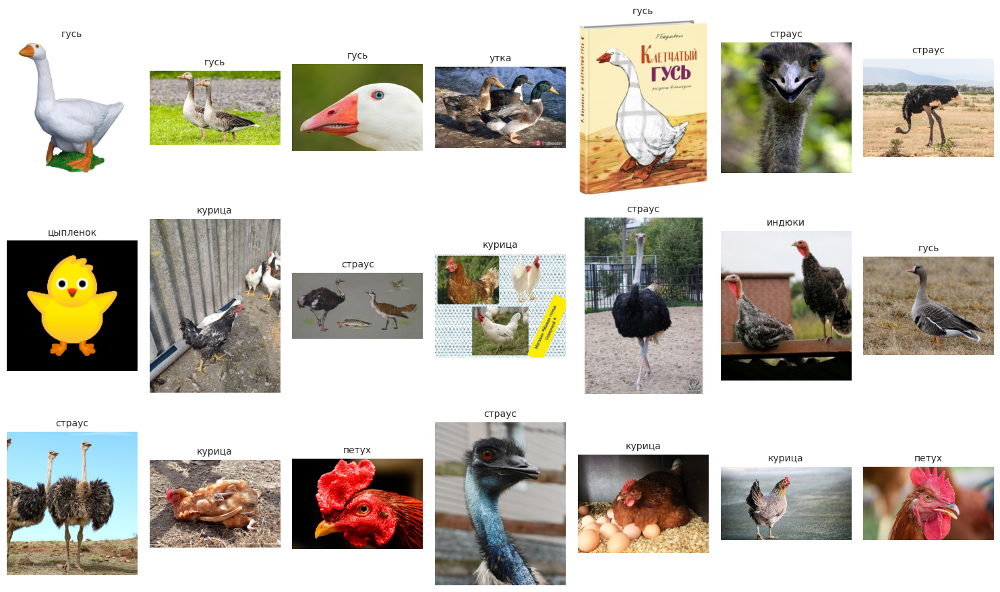

In [ ]:
show_images_with_classes(dataset_path, 21)

Сразу можно подметить, что в датасете присутствуют разного рода снимки и картинки:


> 1. Любительские снимки
> 2. Рисунки
> 3. Профессиональные снимки







In [ ]:
def get_labels_count(dataset):
  labels_count = {}

  class_labels = [i for i in os.listdir(dataset) if os.path.isdir(os.path.join(dataset, i))]

  for label in class_labels:
    cls_path = os.path.join(dataset, label)
    cur_label_images = os.listdir(cls_path)

    labels_count[label] = len([(os.path.join(cls_path, img), label) for img in cur_label_images if img[0] != '.'])

  return labels_count

Text(0.5, 1.0, 'Количетсво семплов в каждом классе')

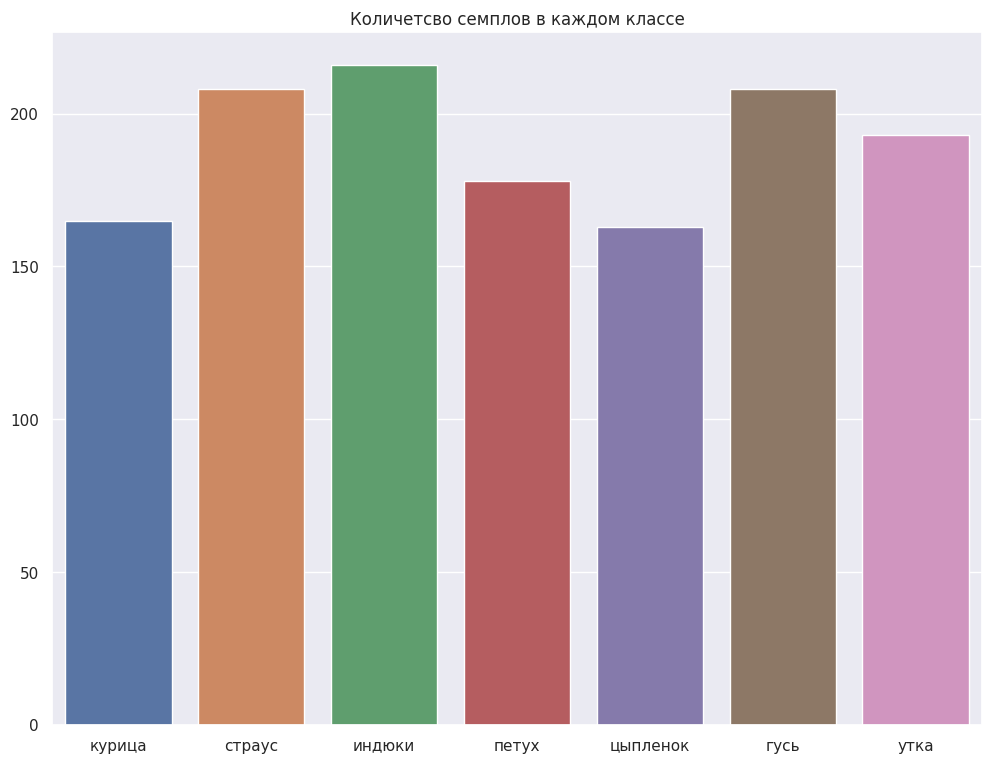

In [ ]:
labels_count = get_labels_count(dataset_path)
fig = sns.barplot(y=labels_count.values(), x=labels_count.keys(), hue=labels_count.keys())
fig.set_title('Количетсво семплов в каждом классе')

In [ ]:
labels_count

{'курица': 165,
 'страус': 208,
 'индюки': 216,
 'петух': 178,
 'цыпленок': 163,
 'гусь': 208,
 'утка': 193}

In [ ]:
temp = min(labels_count.values()) / max(labels_count.values()) * 100

print('Процент самого малочисленного класса в сравнении с числом фоторафий \
самого многочисленного: ', round(temp, 2))

Процент самого малочисленного класса в сравнении с числом фоторафий самого многочисленного:  75.46


In [ ]:
print('Общее число фотографий в датасете: ', sum(labels_count.values()))

Общее число фотографий в датасете:  1331


В целом, датасет имеет незначительный дисбаланс классов (меньший содержит 76% от самого многочисленного), что не должно сильно повлиять на производительность модели, но следует обратить на это внимание при оценке результатов

Датасет довольно забавный и содержит странные семплы - жареная курица в классе курица, утки в папке с гусями и так далее, но будто это не должно сильно повлиять на качество модели

Общее число фоторгафий в датасете 1331 - на 7 классов, исходя из практического опыта, это маловато, поэтому в будущем можно будет добавить аугментации, чтобы повысить генерализующую способность модели

Хочется проверить несколько вариантов решения данной задачи классификации, в рамках эксперимента начнем с самописной модели. Будь это хакатон, либо реальный проект, где нужно выполнить задачу как можно быстрее и с большим качеством, я бы перешел сразу к тренировке предобученной ResNet либо ее аналогов

Также хочется попробовать натренировать модель на эмбеддингах какой-нибудь крошечной VLM - сейчас сфера VLM/LLM на подъеме, эти модели имеют некий common sense об окружающем мире и, по идее, на их эмбеддингах можно будет делать хорошие предсказания

# Тренировка самописной модели


In [ ]:
%load_ext tensorboard

In [ ]:
from torch.utils.tensorboard import SummaryWriter
log_dir = "/runs"
os.makedirs(log_dir, exist_ok=True)
writer = SummaryWriter(log_dir)

In [ ]:
%tensorboard --logdir runs

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)


train_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.RandomHorizontalFlip(),
  transforms.RandomRotation(15),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

full_dataset = ImageFolder(root=dataset_path, transform=train_transform)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
val_dataset.dataset.transform = val_transform

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

print(f"Train samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")


Train samples: 1064, Validation samples: 267


In [ ]:
class Bird_Model_V1(nn.Module):
  def __init__(self, num_classes=7):
    super(Bird_Model_V1, self).__init__()

    self.conv_block1 = nn.Sequential(
      nn.Conv2d(in_channels=3, out_channels=128, kernel_size=3, stride=1, padding=1),
      nn.BatchNorm2d(128),
      nn.ReLU(inplace=False)
    )

    self.conv_block2 = nn.Sequential(
      nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
      nn.BatchNorm2d(128),
      nn.ReLU(inplace=False)
    )

    self.conv_block3 = nn.Sequential(
      nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
      nn.BatchNorm2d(128),
      nn.ReLU(inplace=False)
    )

    self.conv_block4 = nn.Sequential(
    nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(inplace=False)
    )

    self.conv_block5 = nn.Sequential(
    nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(inplace=False)
    )

    self.global_pool = nn.AdaptiveAvgPool2d(7)
    self.fc1 = nn.Linear(7 * 7 * 128, 1024)
    self.fc2 = nn.Linear(1024, 512)
    self.fc3 = nn.Linear(512, num_classes)
    self.dropout1 = nn.Dropout(0.2)
    self.dropout2 = nn.Dropout(0.2)
    self.dropout3 = nn.Dropout(0.2)

  def forward(self, x):
    x_act1 = self.conv_block1(x)

    x_residual = self.conv_block2(x_act1)
    x_act = x_residual + x_act1

    x_residual = self.conv_block3(x_act)
    x = x_residual + x_act

    x_residual = self.conv_block4(x_act)
    x = x_residual + x_act

    x_residual = self.conv_block5(x_act)
    x = x_residual + x_act + x_act1

    x = self.global_pool(x)
    x = x.view(x.size(0), -1)
    x = self.dropout1(x)
    x = self.fc1(x)
    x = self.dropout2(x)
    x = self.fc2(x)
    x = self.dropout3(x)
    x = self.fc3(x)

    return x


In [ ]:
model = Bird_Model_V1(num_classes=7)
model.to(device)

label_counts = torch.tensor(list(labels_count.values()), dtype=torch.float32)
class_weights = 1.0 / label_counts

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.001)
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device) )

num_epochs = 30
best_val_loss = float('inf')

torch.autograd.set_detect_anomaly(True)

for epoch in range(num_epochs):
  model.train()
  running_loss = 0.0
  correct_train = 0
  total_train = 0
  all_preds, all_labels = [], []

  for inputs, labels in train_loader:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()

    outputs = model(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    _, predicted = outputs.max(1)
    correct_train += (predicted == labels).sum().item()
    total_train += labels.size(0)

    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

  train_loss = running_loss / len(train_loader)
  train_accuracy = correct_train / total_train
  train_f1 = f1_score(all_labels, all_preds, average='macro')

  model.eval()
  running_val_loss = 0.0
  correct_val = 0
  total_val = 0
  all_preds, all_labels = [], []

  with torch.no_grad():
    for inputs, labels in val_loader:
      inputs, labels = inputs.to(device), labels.to(device)
      outputs = model(inputs)
      loss = criterion(outputs, labels)

      running_val_loss += loss.item()
      _, predicted = outputs.max(1)
      correct_val += (predicted == labels).sum().item()
      total_val += labels.size(0)

      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())

  val_loss = running_val_loss / len(val_loader)
  val_accuracy = correct_val / total_val
  val_f1 = f1_score(all_labels, all_preds, average='macro')

  writer.add_scalar('Loss/train', train_loss, epoch)
  writer.add_scalar('Loss/val', val_loss, epoch)
  writer.add_scalar('Accuracy/train', train_accuracy, epoch)
  writer.add_scalar('Accuracy/val', val_accuracy, epoch)
  writer.add_scalar('F1-Score/train', train_f1, epoch)
  writer.add_scalar('F1-Score/val', val_f1, epoch)

  if val_loss < best_val_loss:
    best_val_loss = val_loss
    torch.save(model.state_dict(), "best_bird_model_v3.pth")

  print(f"Epoch {epoch+1}/{num_epochs}")
  print(f"Train Loss: {round(train_loss, 3)}, Train Accuracy: {round(train_accuracy, 3)}, Train F1: {round(train_f1, 3)}")
  print(f"Val Loss: {round(val_loss, 3)}, Val Accuracy: {round(val_accuracy, 3)}, Val F1: {round(val_f1, 3)}")

writer.close()


Epoch 1/30
Train Loss: 13.6199, Train Accuracy: 0.2321, Train F1: 0.2312
Val Loss: 4.9381, Val Accuracy: 0.2097, Val F1: 0.1859
Epoch 2/30
Train Loss: 3.6016, Train Accuracy: 0.3487, Train F1: 0.3504
Val Loss: 3.0342, Val Accuracy: 0.4195, Val F1: 0.3668
Epoch 3/30
Train Loss: 3.0496, Train Accuracy: 0.3731, Train F1: 0.3712
Val Loss: 3.0642, Val Accuracy: 0.2734, Val F1: 0.2035
Epoch 4/30
Train Loss: 2.5514, Train Accuracy: 0.3919, Train F1: 0.3978
Val Loss: 1.7046, Val Accuracy: 0.4757, Val F1: 0.4568
Epoch 5/30
Train Loss: 1.6149, Train Accuracy: 0.4793, Train F1: 0.4817
Val Loss: 2.4192, Val Accuracy: 0.3670, Val F1: 0.3717
Epoch 6/30
Train Loss: 1.6337, Train Accuracy: 0.4906, Train F1: 0.4964
Val Loss: 1.6281, Val Accuracy: 0.4757, Val F1: 0.4389
Epoch 7/30
Train Loss: 1.4451, Train Accuracy: 0.5244, Train F1: 0.5274
Val Loss: 2.0124, Val Accuracy: 0.4157, Val F1: 0.3732
Epoch 8/30
Train Loss: 1.3427, Train Accuracy: 0.5733, Train F1: 0.5743
Val Loss: 1.5823, Val Accuracy: 0.4719

Не самый плохой результат, не очень понравились логи обучения - довольно нестабильное обучение, так как метрики скачут по нескольку десятков процентов, это можно исправить понижением lr, ослаблением регуляризации, уменьшением коэффициента в дропаут слоях. Также у модели недостаточная генерализующая способность, f1 score 0.6, к 30-ой эпохе появляются признаки переобучения.

Но все же есть способ хорошо обучить слабую модель - это дистилляция навыков.

# Тренировка предобученной ResNet

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)

train_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.RandomHorizontalFlip(),
  transforms.RandomRotation(15),
  transforms.ToTensor(),
  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.ToTensor(),
  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

full_dataset = ImageFolder(root=dataset_path, transform=train_transform)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
val_dataset.dataset.transform = val_transform

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

print(f"Train samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")


Train samples: 1064, Validation samples: 267


In [ ]:
model = models.resnet18(pretrained=True)

for param in model.parameters():
    param.requires_grad = False

num_classes = len(train_loader.dataset.dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 179MB/s]


In [ ]:
label_counts = torch.tensor(list(labels_count.values()), dtype=torch.float32)
class_weights = 1.0 / label_counts

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.001)
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device) )

num_epochs = 10
best_val_loss = float('inf')

torch.autograd.set_detect_anomaly(True)

for epoch in range(num_epochs):
  model.train()
  running_loss = 0.0
  correct_train = 0
  total_train = 0
  all_preds, all_labels = [], []

  for inputs, labels in train_loader:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()

    outputs = model(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    _, predicted = outputs.max(1)
    correct_train += (predicted == labels).sum().item()
    total_train += labels.size(0)

    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

  train_loss = running_loss / len(train_loader)
  train_accuracy = correct_train / total_train
  train_f1 = f1_score(all_labels, all_preds, average='macro')

  model.eval()
  running_val_loss = 0.0
  correct_val = 0
  total_val = 0
  all_preds, all_labels = [], []

  with torch.no_grad():
    for inputs, labels in val_loader:
      inputs, labels = inputs.to(device), labels.to(device)
      outputs = model(inputs)
      loss = criterion(outputs, labels)

      running_val_loss += loss.item()
      _, predicted = outputs.max(1)
      correct_val += (predicted == labels).sum().item()
      total_val += labels.size(0)

      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())

  val_loss = running_val_loss / len(val_loader)
  val_accuracy = correct_val / total_val
  val_f1 = f1_score(all_labels, all_preds, average='macro')

  writer.add_scalar('Loss/train', train_loss, epoch)
  writer.add_scalar('Loss/val', val_loss, epoch)
  writer.add_scalar('Accuracy/train', train_accuracy, epoch)
  writer.add_scalar('Accuracy/val', val_accuracy, epoch)
  writer.add_scalar('F1-Score/train', train_f1, epoch)
  writer.add_scalar('F1-Score/val', val_f1, epoch)

  if val_loss < best_val_loss:
    best_val_loss = val_loss
    torch.save(model.state_dict(), "resnet18_best.pth")

  print(f"Epoch {epoch+1}/{num_epochs}")
  print(f"Train Loss: {round(train_loss, 3)}, Train Accuracy: {round(train_accuracy, 3)}, Train F1: {round(train_f1, 3)}")
  print(f"Val Loss: {round(val_loss, 3)}, Val Accuracy: {round(val_accuracy, 3)}, Val F1: {round(val_f1, 3)}")

writer.close()

Epoch 1/10
Train Loss: 1.2802, Train Accuracy: 0.5940, Train F1: 0.5911
Val Loss: 0.6718, Val Accuracy: 0.8577, Val F1: 0.8533
Epoch 2/10
Train Loss: 0.5867, Train Accuracy: 0.8825, Train F1: 0.8818
Val Loss: 0.4044, Val Accuracy: 0.9026, Val F1: 0.8999
Epoch 3/10
Train Loss: 0.4243, Train Accuracy: 0.8947, Train F1: 0.8940
Val Loss: 0.3345, Val Accuracy: 0.9101, Val F1: 0.9080
Epoch 4/10
Train Loss: 0.3669, Train Accuracy: 0.8966, Train F1: 0.8952
Val Loss: 0.3116, Val Accuracy: 0.9213, Val F1: 0.9240
Epoch 5/10
Train Loss: 0.2957, Train Accuracy: 0.9239, Train F1: 0.9240
Val Loss: 0.2520, Val Accuracy: 0.9251, Val F1: 0.9247
Epoch 6/10
Train Loss: 0.2676, Train Accuracy: 0.9380, Train F1: 0.9378
Val Loss: 0.2596, Val Accuracy: 0.9176, Val F1: 0.9152
Epoch 7/10
Train Loss: 0.2359, Train Accuracy: 0.9408, Train F1: 0.9403
Val Loss: 0.2444, Val Accuracy: 0.9213, Val F1: 0.9244
Epoch 8/10
Train Loss: 0.2233, Train Accuracy: 0.9445, Train F1: 0.9451
Val Loss: 0.2334, Val Accuracy: 0.9326,

Такой результат был очевиден, эта нейросеть выдает отличные метрики на imagenet, где на порядок больше классов, так решать задачу неинтересно

# Тренировка предобученной SqueezeNet

In [ ]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
model = torchvision.models.squeezenet1_1(pretrained=True)

for param in model.parameters():
    param.requires_grad = False

model.classifier = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Conv2d(512, 7, kernel_size=(1, 1), stride=(1, 1)),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d((1, 1))
)

model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [ ]:
label_counts = torch.tensor(list(labels_count.values()), dtype=torch.float32)
class_weights = 1.0 / label_counts

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.001)
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device) )

num_epochs = 10
best_val_loss = float('inf')

torch.autograd.set_detect_anomaly(True)

for epoch in range(num_epochs):
  model.train()
  running_loss = 0.0
  correct_train = 0
  total_train = 0
  all_preds, all_labels = [], []

  for inputs, labels in train_loader:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()

    outputs = model(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    _, predicted = outputs.max(1)
    correct_train += (predicted == labels).sum().item()
    total_train += labels.size(0)

    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

  train_loss = running_loss / len(train_loader)
  train_accuracy = correct_train / total_train
  train_f1 = f1_score(all_labels, all_preds, average='macro')

  model.eval()
  running_val_loss = 0.0
  correct_val = 0
  total_val = 0
  all_preds, all_labels = [], []

  with torch.no_grad():
    for inputs, labels in val_loader:
      inputs, labels = inputs.to(device), labels.to(device)
      outputs = model(inputs)
      loss = criterion(outputs, labels)

      running_val_loss += loss.item()
      _, predicted = outputs.max(1)
      correct_val += (predicted == labels).sum().item()
      total_val += labels.size(0)

      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())

  val_loss = running_val_loss / len(val_loader)
  val_accuracy = correct_val / total_val
  val_f1 = f1_score(all_labels, all_preds, average='macro')

  writer.add_scalar('Loss/train', train_loss, epoch)
  writer.add_scalar('Loss/val', val_loss, epoch)
  writer.add_scalar('Accuracy/train', train_accuracy, epoch)
  writer.add_scalar('Accuracy/val', val_accuracy, epoch)
  writer.add_scalar('F1-Score/train', train_f1, epoch)
  writer.add_scalar('F1-Score/val', val_f1, epoch)

  if val_loss < best_val_loss:
    best_val_loss = val_loss
    torch.save(model.state_dict(), "squeezenet_best.pth")

  print(f"Epoch {epoch+1}/{num_epochs}")
  print(f"Train Loss: {round(train_loss, 3)}, Train Accuracy: {round(train_accuracy, 3)}, Train F1: {round(train_f1, 3)}")
  print(f"Val Loss: {round(val_loss, 3)}, Val Accuracy: {round(val_accuracy, 3)}, Val F1: {round(val_f1, 3)}")

writer.close()

Epoch 1/10
Train Loss: 0.991, Train Accuracy: 0.664, Train F1: 0.665
Val Loss: 0.625, Val Accuracy: 0.787, Val F1: 0.785
Epoch 2/10
Train Loss: 0.411, Train Accuracy: 0.862, Train F1: 0.862
Val Loss: 0.469, Val Accuracy: 0.839, Val F1: 0.838
Epoch 3/10
Train Loss: 0.272, Train Accuracy: 0.919, Train F1: 0.919
Val Loss: 0.405, Val Accuracy: 0.85, Val F1: 0.844
Epoch 4/10
Train Loss: 0.216, Train Accuracy: 0.932, Train F1: 0.932
Val Loss: 0.415, Val Accuracy: 0.858, Val F1: 0.857
Epoch 5/10
Train Loss: 0.188, Train Accuracy: 0.939, Train F1: 0.939
Val Loss: 0.392, Val Accuracy: 0.861, Val F1: 0.858
Epoch 6/10
Train Loss: 0.146, Train Accuracy: 0.962, Train F1: 0.963
Val Loss: 0.356, Val Accuracy: 0.865, Val F1: 0.863
Epoch 7/10
Train Loss: 0.124, Train Accuracy: 0.973, Train F1: 0.973
Val Loss: 0.353, Val Accuracy: 0.873, Val F1: 0.872
Epoch 8/10
Train Loss: 0.116, Train Accuracy: 0.965, Train F1: 0.965
Val Loss: 0.35, Val Accuracy: 0.873, Val F1: 0.872
Epoch 9/10
Train Loss: 0.095, Trai

Маленькая модель тоже показывает высокое качество, однако его можно улучшить при помощи дистилляции навыков из resnet18

# Квантизация ResNet18

In [ ]:
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 7)
model.load_state_dict(torch.load('resnet18_best.pth', weights_only=True))
model.eval()

original_model_size = os.path.getsize('resnet18_best.pth') / 1024**2
print(f"Размер оригинальной модели: {original_model_size:.2f} МБ")

model.to('cpu')

dummy_input = torch.randn(1, 3, 224, 224).to('cpu')
start_time = time.time()
for _ in range(100):
  with torch.no_grad():
      model(dummy_input)
original_inference_time = (time.time() - start_time) / 100
print(f"Среднее время инференса оригинальной модели: {original_inference_time:.6f} секунд")


quantized_model = torch.quantization.quantize_dynamic(
    model, {nn.Linear}, dtype=torch.qint8
)
torch.save(quantized_model, 'quantized_resnet18.pth')

quantized_model.to('cpu')

quantized_model_size = os.path.getsize('quantized_resnet18.pth') / 1024**2
print(f"Размер квантованной модели: {quantized_model_size:.2f} МБ")

start_time = time.time()
for _ in range(100):
  with torch.no_grad():
      quantized_model(dummy_input)
quantized_inference_time = (time.time() - start_time) / 100
print(f"Среднее время инференса квантованной модели: {quantized_inference_time:.6f} секунд")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Размер оригинальной модели: 42.72 МБ
Среднее время инференса оригинальной модели: 0.093554 секунд
Размер квантованной модели: 42.73 МБ
Среднее время инференса квантованной модели: 0.072136 секунд


In [ ]:

def evaluate_model(model, dataloader):
  model.eval()
  all_preds = []
  all_labels = []
  with torch.no_grad():
    for inputs, labels in dataloader:
      outputs = model(inputs)
      _, preds = torch.max(outputs, 1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
  accuracy = accuracy_score(all_labels, all_preds)
  f1 = f1_score(all_labels, all_preds, average='macro')
  return accuracy, f1

original_accuracy, original_f1 = evaluate_model(model, val_loader)
print(f"Original Accuracy: {round(original_accuracy, 3)}, F1: {round(original_f1, 3)}")

quantized_accuracy, quantized_f1 = evaluate_model(quantized_model, val_loader)
print(f"Quantized Accuracy: {round(quantized_accuracy, 3)}, F1: {round(quantized_f1, 3)}")

Original Accuracy: 0.925, F1: 0.924
Quantized Accuracy: 0.921, F1: 0.921


# Distillation Resnet18 to Bird_Model_V1

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)

train_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.RandomHorizontalFlip(),
  transforms.RandomRotation(15),
  transforms.ToTensor(),
  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.ToTensor(),
  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

full_dataset = ImageFolder(root=dataset_path, transform=train_transform)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
val_dataset.dataset.transform = val_transform

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

print(f"Train samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")


Train samples: 1064, Validation samples: 267


In [ ]:
class Bird_Model_V2(nn.Module):
  def __init__(self, num_classes=7):
    super(Bird_Model_V2, self).__init__()

    self.conv_block1 = nn.Sequential(
      nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1),
      nn.BatchNorm2d(64),
      nn.GELU()
    )

    self.conv_block2 = nn.Sequential(
      nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
      nn.BatchNorm2d(64),
      nn.GELU(),
      nn.Dropout2d(0.2)
    )

    self.conv_block3 = nn.Sequential(
      nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
      nn.BatchNorm2d(128),
      nn.GELU(),
      nn.Dropout2d(0.2)
    )

    self.downsample1 = nn.Conv2d(64, 128, kernel_size=1, stride=1)

    self.global_pool = nn.AdaptiveAvgPool2d(3)
    self.fc1 = nn.Linear(3 * 3 * 128, 256)
    self.fc2 = nn.Linear(256, 64)
    self.fc3 = nn.Linear(64, num_classes)
    self.dropout1 = nn.Dropout(0.4)
    self.dropout2 = nn.Dropout(0.3)
    self.dropout3 = nn.Dropout(0.1)

  def forward(self, x):
    x_act1 = self.conv_block1(x)

    x_residual = self.conv_block2(x_act1)
    x_act = x_residual

    x_residual = self.conv_block3(x_act)
    x = x_residual + self.downsample1(x_act)

    x = self.global_pool(x)
    x = x.view(x.size(0), -1)
    x = self.dropout1(x)
    x = self.fc1(x)
    x = self.dropout2(x)
    x = self.fc2(x)
    x = self.dropout3(x)
    x = self.fc3(x)

    return x


In [ ]:


teacher_model = torchvision.models.resnet18(pretrained=True)

teacher_model.fc = nn.Linear(teacher_model.fc.in_features, 7)
teacher_model.load_state_dict(torch.load('resnet18_best.pth', weights_only=True))

teacher_model.eval()

student_model = Bird_Model_V2(7)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
teacher_model.to(device)
student_model.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 73.6MB/s]


Bird_Model_V2(
  (conv_block1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
  )
  (conv_block2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
    (3): Dropout2d(p=0.2, inplace=False)
  )
  (conv_block3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
    (3): Dropout2d(p=0.2, inplace=False)
  )
  (downsample1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
  (global_pool): AdaptiveAvgPool2d(output_size=3)
  (fc1): Linear(in_features=1152, out_features=256, bias=True)
  (fc2): Linear(in_features=

In [ ]:
def custom_distillation_loss(student_logits, teacher_logits, labels, temperature=2, alpha=0.5):
  soft_loss = F.kl_div(
      F.log_softmax(student_logits / temperature, dim=1),
      F.softmax(teacher_logits / temperature, dim=1),
      reduction='batchmean'
  ) * (temperature ** 2)

  hard_loss = F.cross_entropy(student_logits, labels)

  return alpha * soft_loss + (1 - alpha) * hard_loss

In [ ]:

optimizer = optim.AdamW(student_model.parameters(), lr=0.001)

num_epochs = 30
best_val_loss = float('inf')

torch.autograd.set_detect_anomaly(True)

for epoch in range(num_epochs):
  student_model.train()
  running_loss = 0.0
  correct_train = 0
  total_train = 0
  all_preds, all_labels = [], []

  for inputs, labels in train_loader:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()

    # Получение логитов учителя
    with torch.no_grad():
        teacher_logits = teacher_model(inputs)

    # Логиты студента
    student_logits = student_model(inputs)

    loss = custom_distillation_loss(student_logits, teacher_logits, labels)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    _, predicted = student_logits.max(1)
    correct_train += (predicted == labels).sum().item()
    total_train += labels.size(0)

    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

    train_loss = running_loss / len(train_loader)
    train_accuracy = correct_train / total_train
    train_f1 = f1_score(all_labels, all_preds, average='macro')

    student_model.eval()
    running_val_loss = 0.0
    correct_val = 0
    total_val = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
      for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        teacher_logits = teacher_model(inputs)
        student_logits = student_model(inputs)

        loss = custom_distillation_loss(student_logits, teacher_logits, labels)
        running_val_loss += loss.item()

        _, predicted = student_logits.max(1)
        correct_val += (predicted == labels).sum().item()
        total_val += labels.size(0)

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    val_loss = running_val_loss / len(val_loader)
    val_accuracy = correct_val / total_val
    val_f1 = f1_score(all_labels, all_preds, average='macro')

    if val_loss < best_val_loss:
      best_val_loss = val_loss
      torch.save(student_model.state_dict(), "bird_model_v2_distill_1.pth")

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {round(train_loss, 3)}, Train Accuracy: {round(train_accuracy, 3)}, Train F1: {round(train_f1, 3)}")
    print(f"Val Loss: {round(val_loss, 3)}, Val Accuracy: {round(val_accuracy, 3)}, Val F1: {round(val_f1, 3)}")

Epoch 1/30
Train Loss: 2.724, Train Accuracy: 0.346, Train F1: 0.339
Val Loss: 2.229, Val Accuracy: 0.464, Val F1: 0.441
Epoch 2/30
Train Loss: 2.303, Train Accuracy: 0.47, Train F1: 0.464
Val Loss: 2.339, Val Accuracy: 0.476, Val F1: 0.454
Epoch 3/30
Train Loss: 2.152, Train Accuracy: 0.5, Train F1: 0.5
Val Loss: 2.082, Val Accuracy: 0.502, Val F1: 0.47
Epoch 4/30
Train Loss: 2.098, Train Accuracy: 0.505, Train F1: 0.506
Val Loss: 2.126, Val Accuracy: 0.498, Val F1: 0.511
Epoch 5/30
Train Loss: 2.03, Train Accuracy: 0.537, Train F1: 0.538
Val Loss: 2.016, Val Accuracy: 0.524, Val F1: 0.516
Epoch 6/30
Train Loss: 1.992, Train Accuracy: 0.535, Train F1: 0.536
Val Loss: 1.943, Val Accuracy: 0.521, Val F1: 0.51
Epoch 7/30
Train Loss: 1.957, Train Accuracy: 0.545, Train F1: 0.547
Val Loss: 2.092, Val Accuracy: 0.517, Val F1: 0.516
Epoch 8/30
Train Loss: 1.929, Train Accuracy: 0.57, Train F1: 0.573
Val Loss: 1.831, Val Accuracy: 0.588, Val F1: 0.593
Epoch 9/30
Train Loss: 1.901, Train Accur

дистилляция показывает ощутимый прирост к качеству, однако результаты все равно неудовлетворительны, модели больших размеров уже не влезают в память видеокарты

In [ ]:
pytorch_total_params = sum(p.numel() for p in student_model.parameters())
pytorch_total_params

433479

In [ ]:
pytorch_total_params = sum(p.numel() for p in teacher_model.parameters())
pytorch_total_params

11180103

#Distillation SqueezeNet

In [ ]:
teacher_model = torchvision.models.resnet18(pretrained=True)

teacher_model.fc = nn.Linear(teacher_model.fc.in_features, 7)
teacher_model.load_state_dict(torch.load('resnet18_best.pth', weights_only=True))

teacher_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
student_model = torchvision.models.squeezenet1_1(pretrained=True)

for param in student_model.parameters():
    param.requires_grad = False

student_model.classifier = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Conv2d(512, 7, kernel_size=(1, 1), stride=(1, 1)),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d((1, 1))
)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
teacher_model.to(device)
student_model.to(device)

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [ ]:
optimizer = optim.AdamW(student_model.parameters(), lr=0.001)

num_epochs = 30
best_val_loss = float('inf')

torch.autograd.set_detect_anomaly(True)

for epoch in range(num_epochs):
  student_model.train()
  running_loss = 0.0
  correct_train = 0
  total_train = 0
  all_preds, all_labels = [], []

  for inputs, labels in train_loader:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()

    # Получение логитов учителя
    with torch.no_grad():
        teacher_logits = teacher_model(inputs)

    # Логиты студента
    student_logits = student_model(inputs)

    loss = custom_distillation_loss(student_logits, teacher_logits, labels)
    loss.backward()
    optimizer.step()

    running_loss += loss.item()
    _, predicted = student_logits.max(1)
    correct_train += (predicted == labels).sum().item()
    total_train += labels.size(0)

    all_preds.extend(predicted.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

    train_loss = running_loss / len(train_loader)
    train_accuracy = correct_train / total_train
    train_f1 = f1_score(all_labels, all_preds, average='macro')

    student_model.eval()
    running_val_loss = 0.0
    correct_val = 0
    total_val = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
      for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        teacher_logits = teacher_model(inputs)
        student_logits = student_model(inputs)

        loss = custom_distillation_loss(student_logits, teacher_logits, labels)
        running_val_loss += loss.item()

        _, predicted = student_logits.max(1)
        correct_val += (predicted == labels).sum().item()
        total_val += labels.size(0)

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    val_loss = running_val_loss / len(val_loader)
    val_accuracy = correct_val / total_val
    val_f1 = f1_score(all_labels, all_preds, average='macro')

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(student_model.state_dict(), "squeezenet_distill.pth")

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {round(train_loss, 3)}, Train Accuracy: {round(train_accuracy, 3)}, Train F1: {round(train_f1, 3)}")
    print(f"Val Loss: {round(val_loss, 3)}, Val Accuracy: {round(val_accuracy, 3)}, Val F1: {round(val_f1, 3)}")

Epoch 1/30
Train Loss: 2.131, Train Accuracy: 0.506, Train F1: 0.509
Val Loss: 0.975, Val Accuracy: 0.798, Val F1: 0.798
Epoch 2/30
Train Loss: 0.684, Train Accuracy: 0.851, Train F1: 0.851
Val Loss: 0.543, Val Accuracy: 0.884, Val F1: 0.881
Epoch 3/30
Train Loss: 0.449, Train Accuracy: 0.91, Train F1: 0.909
Val Loss: 0.514, Val Accuracy: 0.869, Val F1: 0.868
Epoch 4/30
Train Loss: 0.374, Train Accuracy: 0.923, Train F1: 0.923
Val Loss: 0.457, Val Accuracy: 0.888, Val F1: 0.885
Epoch 5/30
Train Loss: 0.33, Train Accuracy: 0.933, Train F1: 0.933
Val Loss: 0.454, Val Accuracy: 0.858, Val F1: 0.85
Epoch 6/30
Train Loss: 0.319, Train Accuracy: 0.943, Train F1: 0.942
Val Loss: 0.425, Val Accuracy: 0.884, Val F1: 0.879
Epoch 7/30
Train Loss: 0.283, Train Accuracy: 0.954, Train F1: 0.954
Val Loss: 0.427, Val Accuracy: 0.891, Val F1: 0.888
Epoch 8/30
Train Loss: 0.268, Train Accuracy: 0.963, Train F1: 0.963
Val Loss: 0.409, Val Accuracy: 0.895, Val F1: 0.892
Epoch 9/30
Train Loss: 0.25, Train 

KeyboardInterrupt: 

In [ ]:


def measure_time(model, dataloader, device):
  model.to(device)
  model.eval()
  start_time = time.time()
  with torch.no_grad():
      for inputs, _ in dataloader:
          inputs = inputs.to(device)
          _ = model(inputs)
  total_time = time.time() - start_time
  return total_time

teacher_inference_time = measure_time(teacher_model, val_loader, device)
print(f"Teacher Model Time: {teacher_inference_time:.4f} seconds")

student_inference_time = measure_time(student_model, val_loader, device)
print(f"Student Model Time: {student_inference_time:.4f} seconds")

Teacher Model Inference Time: 4.3329 seconds
Student Model Inference Time: 3.4968 seconds


In [ ]:
def evaluate_model(model, dataloader, device):
  model.eval()
  correct = 0
  total = 0
  all_preds, all_labels = [], []

  with torch.no_grad():
    for inputs, labels in dataloader:
      inputs, labels = inputs.to(device), labels.to(device)
      outputs = model(inputs)
      _, predicted = outputs.max(1)
      correct += (predicted == labels).sum().item()
      total += labels.size(0)
      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())

  accuracy = correct / total
  f1 = f1_score(all_labels, all_preds, average='macro')
  return accuracy, f1

# Оценка учителя
teacher_accuracy, teacher_f1 = evaluate_model(teacher_model, val_loader, device)
print(f"Teacher Model - Accuracy: {round(teacher_accuracy, 3)}, F1: {round(teacher_f1, 3)}")

# Оценка студента
student_accuracy, student_f1 = evaluate_model(student_model, val_loader, device)
print(f"Student Model - Accuracy: {round(student_accuracy, 3)}, F1: {round(student_f1, 3)}")


Teacher Model - Accuracy: 0.925, F1: 0.924
Student Model - Accuracy: 0.906, F1: 0.903


при гораздо меньшем числе параметров squeezenet показывает сравнимый результат по качеству

#CNN Autoencoder

Так как датасет сам по себе маленький, а тестовая выборка похожа на тренировочную, решил взять датасет на 10 тысяч картинок птиц и обучить автоенкодер, чтобы в дальнейшем докрутить на него классификатор, получив тем самым более устойчивую к реальным данным модель

https://universe.roboflow.com/test-yrgzw/bird-test-9apju/dataset/1#

(датасет не рекомендуется скачивать для воспроизведения результатов, т.к. обученная модель не зарекомендовала себя)

In [ ]:
!unzip /content/drive/MyDrive/bird_dataset_extra.zip -d /content/bird_dataset_extra

Выходные данные были обрезаны до нескольких последних строк (5000).
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.038deb26324ae133a68a3bab9d346531.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.08830c4062f495320591ed3cf2392896.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.0e8d6a5b85c3ef2ecd05c38434d7a59c.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.234c9c2fec306d1f2a652c0e1fab79e8.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.34e68931f5a458cdda895e6d31da8eeb.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.34e962ee67c943f919afbc91e5f630b9.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.387a2efc037eebea95af9ad830685c34.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.3df5ee685d9349f26d36b555e8b16e9f.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.43480b8dd156a9f60e40c64404075790.jpg  
 extracting: /content/bird_dataset_extra/train/097_jpg.rf.4

In [ ]:
bird_extra_path = '/content/bird_dataset_extra/'

In [ ]:
class Bird_Autoencoder(nn.Module):
    def __init__(self):
      super(Bird_Autoencoder, self).__init__()

      self.encoder = nn.Sequential(
          nn.Conv2d(in_channels=3, out_channels=128, kernel_size=3, stride=2, padding=1),
          nn.BatchNorm2d(128),
          nn.GELU(),
          nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1),
          nn.BatchNorm2d(128),
          nn.GELU(),
          nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
          nn.BatchNorm2d(256),
          nn.GELU(),
          nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1),
          nn.BatchNorm2d(512),
          nn.GELU(),
      )

      self.decoder = nn.Sequential(
          nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1),
          nn.BatchNorm2d(256),
          nn.GELU(),
          nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1),
          nn.BatchNorm2d(128),
          nn.GELU(),
          nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1),
          nn.BatchNorm2d(128),
          nn.GELU(),
          nn.ConvTranspose2d(in_channels=128, out_channels=3, kernel_size=3, stride=2, padding=1, output_padding=1),
          nn.Sigmoid(),
      )

    def forward(self, x):
      x = self.encoder(x)
      x = self.decoder(x)
      return x

    def encode(self, x):
      return self.encoder(x)

In [ ]:
import os
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class CustomImageDataset(Dataset):
  def __init__(self, root_dir, transform=None):
    self.root_dir = root_dir
    self.transform = transform
    self.image_paths = [os.path.join(root_dir, fname)
                      for fname in os.listdir(root_dir)
                      if fname.lower().endswith(('.png', '.jpg', '.jpeg'))]

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, idx):
    img_path = self.image_paths[idx]
    image = Image.open(img_path).convert("RGB")
    if self.transform:
      image = self.transform(image)
    return image, 0

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = CustomImageDataset(root_dir=bird_extra_path + 'train', transform=train_transform)
val_dataset = CustomImageDataset(root_dir=bird_extra_path + 'valid', transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)

print(f"Train samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")


Train samples: 6941, Validation samples: 1986


In [ ]:
model = Bird_Autoencoder()
model.to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

for epoch in range(40):
    model.train()
    train_loss = 0.0
    for inputs, _ in train_loader:
        inputs = inputs.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    train_loss /= len(train_loader)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, _ in val_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, inputs)
            val_loss += loss.item()

    val_loss /= len(val_loader)

    print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")


Epoch 1, Train Loss: -0.1617, Val Loss: -0.2839
Epoch 2, Train Loss: -0.3470, Val Loss: -0.3864


KeyboardInterrupt: 

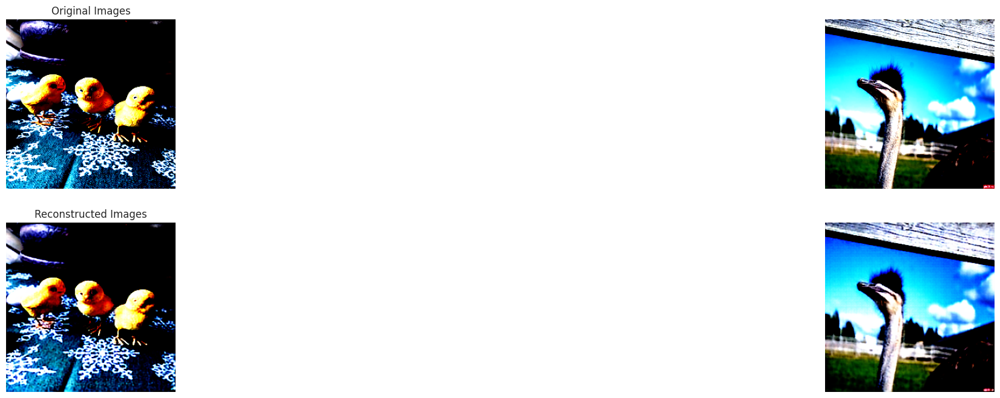

In [ ]:
import matplotlib.pyplot as plt

model.eval()
sample_images, _ = next(iter(val_loader))
sample_images = sample_images.to(device)

with torch.no_grad():
    reconstructed = model(sample_images).cpu()

fig, axes = plt.subplots(2, 2, figsize=(32, 8))
for i in range(2):
  axes[0, i].imshow(sample_images[i].permute(1, 2, 0).to('cpu').numpy())
  axes[0, i].axis('off')
  axes[1, i].imshow(reconstructed[i].permute(1, 2, 0).to('cpu').numpy())
  axes[1, i].axis('off')

axes[0, 0].set_title("Original")
axes[1, 0].set_title("Reconstructed")
plt.show()


In [ ]:
torch.save(model, 'Bird_AE.pth')
torch.save(model.state_dict(), 'Bird_AE_state_dict.pth')

Результаты получились не лучшими, были попытки обучить классификатор поверх эмбеддингов, однако он выдал низкий скор.

# Resnet + XGBoost

подход заменяет дообучение последнего слоя ResNet18 использованием XGBoost в качестве классификатора на базе предобученных эмбеддингов


In [ ]:
bird_encoder      = models.resnet18(pretrained=True)
bird_encoder.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
pytorch_total_params = sum(p.numel() for p in bird_encoder.parameters())
pytorch_total_params

11689512

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)


train_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.RandomHorizontalFlip(),
  transforms.RandomRotation(15),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

full_dataset = ImageFolder(root=dataset_path, transform=train_transform)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
val_dataset.dataset.transform = val_transform

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

test_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.ToTensor(),
  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_dataset = ImageFolder(root=dataset_path.replace('train', 'test'), transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

print(f"Test samples: {len(test_dataset)}")
print(f"Train samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")

Test samples: 280
Train samples: 1064, Validation samples: 267


In [ ]:
def extract_embeddings_and_labels(model, dataloader, device):
  model.eval()
  embeddings = []
  labels_out = []
  with torch.no_grad():
    for inputs, labels in dataloader:
      inputs, labels = inputs.to(device), labels.to(device)
      labels_out.append(labels.cpu().numpy())
      encoded = model(inputs)
      flattened = encoded.view(encoded.size(0), -1)
      embeddings.append(flattened.cpu().numpy())
  return np.concatenate(embeddings, axis=0), np.concatenate(labels_out, axis=0)


bird_encoder.to(device)
train_embeddings, train_labels = extract_embeddings_and_labels(bird_encoder, train_loader, device)
val_embeddings, val_labels = extract_embeddings_and_labels(bird_encoder, val_loader, device)
test_embeddings, test_labels = extract_embeddings_and_labels(bird_encoder, test_loader, device)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=50, random_state=42)
train_pca = pca.fit_transform(train_embeddings)
val_pca = pca.transform(val_embeddings)

xgb = XGBClassifier(random_state=42)
xgb.fit(train_pca, train_labels)

accuracy = xgb.score(val_pca, val_labels)
accuracy

0.8651685393258427

In [ ]:
test_pca = pca.transform(test_embeddings)
accuracy = xgb.score(test_pca, test_labels)
print(f"accuracy на тесте: {round(accuracy, 3)}")

accuracy на тесте: 0.971



Способ получить достойное качество без дообучения тяжелой модели, однако он требует прогона всего датасета через нее.


#Оценка качества

In [ ]:
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)

test_transform = transforms.Compose([
  transforms.Resize((256, 256)),
  transforms.ToTensor(),
  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

dataset_path = os.path.join(extract_path, 'bird_dataset', 'test')
test_dataset = ImageFolder(root=dataset_path, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

print(f"Test samples: {len(test_dataset)}")

Test samples: 280


In [ ]:
# загружаем  все модели
bird_model_distill = Bird_Model_V2(7)
resnet18_best      = torchvision.models.resnet18(pretrained=False)
resnet18_quantized = torch.load('quantized_resnet18.pth')
squeezenet_best    =  torchvision.models.squeezenet1_1(pretrained=False)
squeezenet_distill =  torchvision.models.squeezenet1_1(pretrained=False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
<ipython-input-18-3e3457cff6f1>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions

In [ ]:
bird_model_distill.load_state_dict(torch.load('bird_model_v2_distill_1.pth', weights_only=True))
resnet18_best.eval()

resnet18_best.fc = nn.Linear(resnet18_best.fc.in_features, 7)
resnet18_best.load_state_dict(torch.load('resnet18_best.pth', weights_only=True))
resnet18_best.eval()

resnet18_quantized.eval()

squeezenet_best.classifier = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Conv2d(512, 7, kernel_size=(1, 1), stride=(1, 1)),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d((1, 1))
)
squeezenet_best.load_state_dict(torch.load('squeezenet_best.pth', weights_only=True))
squeezenet_best.eval()

squeezenet_distill.classifier = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Conv2d(512, 7, kernel_size=(1, 1), stride=(1, 1)),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d((1, 1))
)
squeezenet_distill.load_state_dict(torch.load('squeezenet_distill.pth', weights_only=True))
squeezenet_distill.eval()

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

In [ ]:
results = {}

def evaluate_model(model, dataloader, class_names, device=device):
  model.eval()
  all_preds = []
  all_labels = []

  with torch.no_grad():
    for inputs, labels in dataloader:
      outputs = model(inputs.to(device))
      _, preds = torch.max(outputs, 1)
      all_preds.extend(preds.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())

  accuracy = accuracy_score(all_labels, all_preds)
  f1 = f1_score(all_labels, all_preds, average='macro')

  cm = confusion_matrix(all_labels, all_preds)
  per_class_accuracy = cm.diagonal() / cm.sum(axis=1)

  return accuracy, f1, per_class_accuracy, cm


for model, name in [
    [bird_model_distill, 'bird'],
    [resnet18_best, 'resnet18'],
    [resnet18_quantized, 'resnet18_quant'],
    [squeezenet_best, 'squeeze'],
    [squeezenet_distill, 'squeeze_distill']]:

    if name == 'resnet18_quant':
      device_ = 'cpu'
    else:
       device_ = device


    accuracy, f1, per_class_accuracy, cm = evaluate_model(model.to(device_), test_loader, test_dataset.classes, device_)

    per_class_pass = all(acc >= 0.8 for acc in per_class_accuracy)
    overall_pass = accuracy >= 0.85

    results[name] = {
        'accuracy': round(accuracy, 3),
        'f1': round(f1, 3),
        'per_class_accuracy': per_class_accuracy.tolist(),
        'pass': overall_pass and per_class_pass
    }

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(cm, cmap='Blues')
    ax.set_xticks(np.arange(len(test_dataset.classes)))
    ax.set_yticks(np.arange(len(test_dataset.classes)))
    ax.set_xticklabels(list(test_dataset.class_to_idx.keys()))
    ax.set_yticklabels(list(test_dataset.class_to_idx.keys()))
    ax.grid(False)
    ax.set_frame_on(False)
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    plt.title(f"Confusion Matrix for {name}")

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, cm[i, j], ha="center", va="center", color="black")

    plt.savefig(f"confusion_matrix_{name}.png")
    plt.close()

In [ ]:
for _ in range(5):
  for model, name in [
    [bird_model_distill, 'bird'],
    [resnet18_best, 'resnet18'],
    [resnet18_quantized, 'resnet18_quant'],
    [squeezenet_best, 'squeeze'],
    [squeezenet_distill, 'squeeze_distill']]:

    if name == 'resnet18_quant':
      device_ = 'cpu'
    else:
      device_ = device

    accuracy, f1, per_class_accuracy, cm = evaluate_model(model.to(device_), test_loader, test_dataset.classes, device_)

    per_class_pass = all(acc >= 0.8 for acc in per_class_accuracy)
    overall_pass = accuracy >= 0.85

    new_per_class_accuracy = []
    for i in range(len(per_class_accuracy)):
      results[name]['per_class_accuracy'][i] += per_class_accuracy[i]

    results[name]['accuracy'] += round(accuracy, 3)
    results[name]['f1'] += round(f1, 3)
    results[name]['pass'] = results[name]['pass'] and overall_pass and per_class_pass

In [ ]:
for model_name, result in results.items():
  print(model_name)
  print('\t', round(result['accuracy'] / 6, 3), round(result['f1'] / 6, 3), result['pass'])

bird
	 0.586 0.59 False
resnet18
	 0.961 0.961 True
resnet18_quant
	 0.961 0.961 True
squeeze
	 0.975 0.975 True
squeeze_distill
	 0.964 0.965 True


In [ ]:
for model_name, result in results.items():
  print(model_name)
  print('\t', round(result['accuracy'] / 6, 3), round(result['f1'] / 6, 3), result['pass'])

bird
	 0.586 0.59 False
resnet18
	 0.961 0.961 True
resnet18_quant
	 0.961 0.961 True
squeeze
	 0.975 0.975 True
squeeze_distill
	 0.964 0.965 True


In [ ]:

models = {
    'bird': bird_model_distill,
    'resnet18': resnet18_best,
    'resnet18_quant': resnet18_quantized,
    'squeeze': squeezenet_best,
    'squeeze_distill': squeezenet_distill
}

data = []

for name, model in models.items():
    num_params = sum(i.numel() for i in model.parameters())
    accuracy = round(results[name]['accuracy'] / 6, 3)
    f1 = round(results[name]['f1'] / 6, 3)
    data.append({'Model': name, 'Accuracy': accuracy, 'F1': f1, 'Parameters': num_params})

df = pd.DataFrame(data)

df.to_csv('model_results.csv', index=False)

df


,Model,Accuracy,F1,Parameters
0,bird,0.586,0.590,433479
1,resnet18,0.961,0.961,11180103
2,resnet18_quant,0.961,0.961,11176512
3,squeeze,0.975,0.975,726087
4,squeeze_distill,0.964,0.965,726087


In [ ]:
df = pd.read_csv('model_results.csv')
markdown_table = df.to_markdown(index=False)
print(markdown_table)

| Model           |   Accuracy |    F1 |   Parameters |
|:----------------|-----------:|------:|-------------:|
| bird            |      0.586 | 0.59  |       433479 |
| resnet18        |      0.961 | 0.961 |     11180103 |
| resnet18_quant  |      0.961 | 0.961 |     11176512 |
| squeeze         |      0.975 | 0.975 |       726087 |
| squeeze_distill |      0.964 | 0.965 |       726087 |
